In [1]:
import soundfile as sf
import numpy
import matplotlib.pyplot as plt
import IPython.display as display
import soundfile as sf
import time
import os

# Read in Data

In [2]:
targetFile = "aegithina-viridissima"

In [3]:
data, sampleRate = sf.read("data/" + targetFile + ".wav")

In [4]:
data

array([[0., 0.],
       [0., 0.],
       [0., 0.],
       ...,
       [0., 0.],
       [0., 0.],
       [0., 0.]])

# Visualization

In [5]:
display.Audio(data.T, rate=sampleRate)

/opt/anaconda3/lib/python3.8/site-packages/matplotlib/axes/_axes.py:7592: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


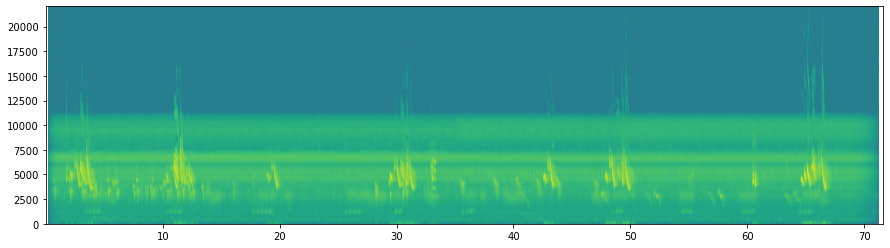

In [6]:
fig, ax = plt.subplots()
fig.set_figwidth(15)
ax.specgram(data[:,0], Fs=sampleRate)
plt.show()

# Processing

In [7]:
# Get the intensity for each frame and get the abs value.
tmp = data[:,0]
tmp = [abs(i) for i in tmp]

In [8]:
# Get the overall intensity for each second.
intensity = [sum(tmp[i:i+sampleRate]) for i in range(0, len(tmp), sampleRate)]
intensity

[45.19482421875,
 195.06463623046875,
 1562.4742736816406,
 2678.3825073242188,
 247.27798461914062,
 220.68035888671875,
 164.36996459960938,
 211.96337890625,
 132.0867919921875,
 146.16851806640625,
 535.9209899902344,
 4046.1912536621094,
 1075.0609436035156,
 142.3724365234375,
 91.31228637695312,
 83.46060180664062,
 91.49346923828125,
 88.748046875,
 148.86770629882812,
 1049.9445190429688,
 89.2308349609375,
 85.29351806640625,
 78.79861450195312,
 77.83349609375,
 78.1651611328125,
 82.4298095703125,
 88.8836669921875,
 91.56671142578125,
 241.23385620117188,
 869.1890869140625,
 3033.749786376953,
 1706.0084228515625,
 116.49917602539062,
 468.48577880859375,
 79.03054809570312,
 137.67388916015625,
 80.56756591796875,
 77.548095703125,
 145.74172973632812,
 80.60650634765625,
 134.5931396484375,
 85.34942626953125,
 1309.581787109375,
 2188.2111206054688,
 70.10296630859375,
 66.41702270507812,
 75.86880493164062,
 876.9005737304688,
 2972.261993408203,
 4277.169738769531,
 

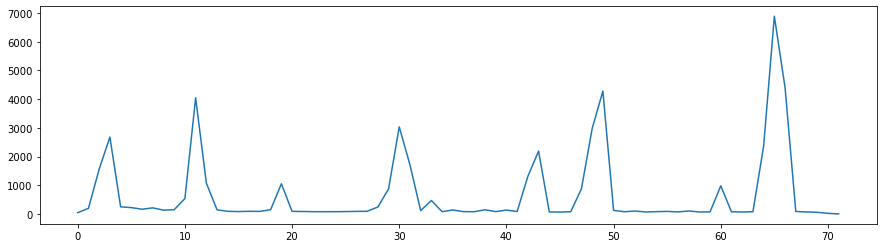

In [9]:
fig, ax = plt.subplots()
fig.set_figwidth(15)
ax.plot(intensity)
plt.show()

In [10]:
# Get all seconds higher than threashold.
threashold = 500
res = []
for sec in range(0, len(intensity)):
    if intensity[sec] > threashold:
        res.append(sec)
res

[2, 3, 10, 11, 12, 19, 29, 30, 31, 42, 43, 47, 48, 49, 60, 64, 65, 66]

In [11]:
# Get all consequtive seconds
clipCollection = []
workingSet = []
for i in res:
    if len(workingSet) == 0:
        workingSet.append(i)
        continue
    if i - workingSet[-1] == 1:
        workingSet.append(i)
        continue
    clipCollection.append(workingSet)
    workingSet = [i]

if len(workingSet) != 0:
    clipCollection.append(workingSet)

clipCollection

[[2, 3],
 [10, 11, 12],
 [19],
 [29, 30, 31],
 [42, 43],
 [47, 48, 49],
 [60],
 [64, 65, 66]]

In [12]:
# Make collection range
tmp = []
for item in clipCollection:
    tmp.append([min(item), max(item)])
clipCollection = tmp
clipCollection

[[2, 3], [10, 12], [19, 19], [29, 31], [42, 43], [47, 49], [60, 60], [64, 66]]

In [13]:
# Set safe area
timeStr = time.ctime().replace(":", "-").replace(" ", "_")
dirName = f"output/{targetFile}_{timeStr}"
os.mkdir(dirName)
guard = int(1*sampleRate)
for i in range(len(clipCollection)):
    clip = data[sampleRate*clipCollection[i][0]-guard:sampleRate*clipCollection[i][1]+guard*2]
    sf.write(f'{dirName}/out_{clipCollection[i][0]}_{clipCollection[i][1]}.wav', clip, sampleRate, 'PCM_24')